# Fine Tuning for fundus image classification

Trains a CNN model for image classificaiton (Disease, NotDisease)

## 数据准备

只需要运行一次

------------------------

    Date: April, 2021

    N: Normal. 500
    Y: ROP. 500. Include: Stage 1: 106. Stage 2: 167. Stage 3: 150. Stage 4: 77.
    
    Saved to '../data/fundus/C2/C2_202104.pkl'
 ------------------------   
    
    Date: August, 2021

    N: Normal. 1000
    Y: Stage 1: 216. Stage 2: 663. Stage 3: 846. Stage 4: 77.
    
    Saved to '../data/fundus/C5/C5_202108.pkl'
    
    In this study, we combine Stage1 & Stage2, Stage3 & Stage4

In [1]:
from tlearner.efficientnet import transfer_learner
learner = transfer_learner("fundus_C3_customEfficientNetB0_model", W = 224)

## 数据读取，并保存到pkl（只需要运行一次）

In [2]:
data_path = 'F:/备份/keras/data/fundus/C5/202108/'
learner.load_dataset(data_path, use_mask = True, PKL_PATH = "fundus_efficientnet_dataset.pkl")
print(dir(learner))

['N', 'S1', 'S2', 'S3', 'S4']
Loaded the images of dataset-N

Loaded the images of dataset-S1

Loaded the images of dataset-S2

Loaded the images of dataset-S3

Loaded the images of dataset-S4

(2305, 1, 224, 224, 3)
(1, 2305, 224, 224, 3)
(2305, 224, 224, 3)
pickled in  F:/备份/fundus_efficientnet_dataset.pkl
['BEST_MODEL', 'FLAVOR', 'MASK', 'MODEL_NAME', 'W', 'X_train', 'X_val', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'batch_classification', 'binary_cls_eval', 'class_names', 'continue_train', 'convert_to_tflite', 'evaluate', 'get_best_model', 'labels', 'load_best_model', 'load_dataset', 'load_dataset_from_pkl', 'load_mask', 'num_classes', 'num_of_samples', 'plot_best_model', 'predict_fil

## 从pkl直接数据读取，读取训练集、验证集、类标签等

In [2]:
learner.load_dataset_from_pkl(PKL_PATH = "fundus_efficientnet_dataset.pkl")

## C5 -> C3

In [3]:
import math
from tensorflow.python.keras.utils.np_utils import to_categorical

learner.class_names = ['Normal', 'Stage1~2', 'Stage3~4']
learner.num_classes = len(learner.class_names)

def combine_class(c):
    return math.ceil(c/2.0)

y_train_c = list(map(combine_class, learner.y_train.argmax(-1)))
# convert class labels to on-hot encoding
learner.y_train = to_categorical(y_train_c, learner.num_classes)

y_val_c = list(map(combine_class, learner.y_val.argmax(-1)))
# convert class labels to on-hot encoding
learner.y_val = to_categorical(y_val_c, learner.num_classes)

In [4]:
hist = learner.train("EfficientNetB0", 
    batch = 12, epochs = [20,10], optimizer = "rmsprop")

Epoch 1/20
154/154 [==============================] - 32s 62ms/step - loss: 0.7938 - accuracy: 0.6584 - val_loss: 0.5725 - val_accuracy: 0.7744
Epoch 2/20
154/154 [==============================] - 7s 44ms/step - loss: 0.5948 - accuracy: 0.7435 - val_loss: 0.5528 - val_accuracy: 0.7722
Epoch 3/20
154/154 [==============================] - 7s 44ms/step - loss: 0.5196 - accuracy: 0.7983 - val_loss: 0.4938 - val_accuracy: 0.8221
Epoch 4/20
154/154 [==============================] - 7s 44ms/step - loss: 0.4449 - accuracy: 0.8194 - val_loss: 0.4748 - val_accuracy: 0.7939
Epoch 5/20
154/154 [==============================] - 6s 41ms/step - loss: 0.3931 - accuracy: 0.8454 - val_loss: 0.6209 - val_accuracy: 0.7766
Epoch 6/20
154/154 [==============================] - 7s 44ms/step - loss: 0.3681 - accuracy: 0.8612 - val_loss: 0.4573 - val_accuracy: 0.8351
Epoch 7/20
154/154 [==============================] - 7s 44ms/step - loss: 0.3569 - accuracy: 0.8606 - val_loss: 0.4572 - val_accuracy: 0.824

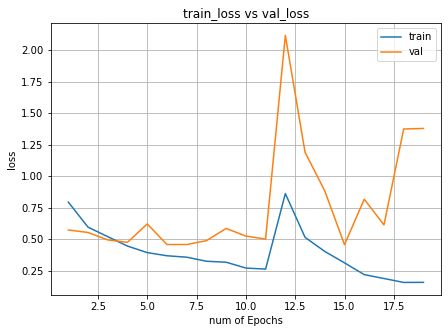

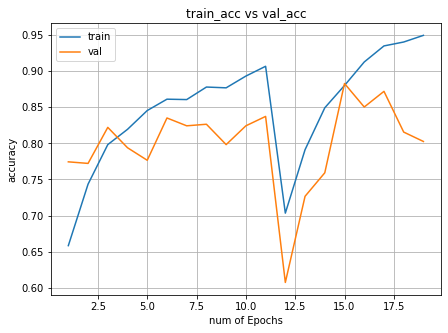

In [16]:
from tlearner.efficientnet import plot_two_stage_hist
plot_two_stage_hist(hist[0], hist[1]) # , len(hist[0])+ len(hist[1]))

## Continue Training

If the model doesn't reach the best, continue training

# get the best model

In [17]:
learner.get_best_model().summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 tf.math.truediv (TFOpLambda)   (None, 224, 224, 3)  0           ['normalization[0][0]']      

 block2a_project_conv (Conv2D)  (None, 56, 56, 24)   2304        ['block2a_se_excite[0][0]']      
                                                                                                  
 block2a_project_bn (BatchNorma  (None, 56, 56, 24)  96          ['block2a_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block2b_expand_conv (Conv2D)   (None, 56, 56, 144)  3456        ['block2a_project_bn[0][0]']     
                                                                                                  
 block2b_expand_bn (BatchNormal  (None, 56, 56, 144)  576        ['block2b_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block2b_e

 block3b_expand_bn (BatchNormal  (None, 28, 28, 240)  960        ['block3b_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block3b_expand_activation (Act  (None, 28, 28, 240)  0          ['block3b_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block3b_dwconv (DepthwiseConv2  (None, 28, 28, 240)  6000       ['block3b_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block3b_bn (BatchNormalization  (None, 28, 28, 240)  960        ['block3b_dwconv[0][0]']         
 )        

 D)                                                              ']                               
                                                                                                  
 block4b_bn (BatchNormalization  (None, 14, 14, 480)  1920       ['block4b_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block4b_activation (Activation  (None, 14, 14, 480)  0          ['block4b_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block4b_se_squeeze (GlobalAver  (None, 480)         0           ['block4b_activation[0][0]']     
 agePooling2D)                                                                                    
          

 block5a_activation (Activation  (None, 14, 14, 480)  0          ['block5a_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block5a_se_squeeze (GlobalAver  (None, 480)         0           ['block5a_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5a_se_reshape (Reshape)   (None, 1, 1, 480)    0           ['block5a_se_squeeze[0][0]']     
                                                                                                  
 block5a_se_reduce (Conv2D)     (None, 1, 1, 20)     9620        ['block5a_se_reshape[0][0]']     
                                                                                                  
 block5a_s

 block5c_se_expand (Conv2D)     (None, 1, 1, 672)    19488       ['block5c_se_reduce[0][0]']      
                                                                                                  
 block5c_se_excite (Multiply)   (None, 14, 14, 672)  0           ['block5c_activation[0][0]',     
                                                                  'block5c_se_expand[0][0]']      
                                                                                                  
 block5c_project_conv (Conv2D)  (None, 14, 14, 112)  75264       ['block5c_se_excite[0][0]']      
                                                                                                  
 block5c_project_bn (BatchNorma  (None, 14, 14, 112)  448        ['block5c_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block5c_d

 block6b_project_bn (BatchNorma  (None, 7, 7, 192)   768         ['block6b_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block6b_drop (Dropout)         (None, 7, 7, 192)    0           ['block6b_project_bn[0][0]']     
                                                                                                  
 block6b_add (Add)              (None, 7, 7, 192)    0           ['block6b_drop[0][0]',           
                                                                  'block6a_project_bn[0][0]']     
                                                                                                  
 block6c_expand_conv (Conv2D)   (None, 7, 7, 1152)   221184      ['block6b_add[0][0]']            
                                                                                                  
 block6c_e

 block6d_add (Add)              (None, 7, 7, 192)    0           ['block6d_drop[0][0]',           
                                                                  'block6c_add[0][0]']            
                                                                                                  
 block7a_expand_conv (Conv2D)   (None, 7, 7, 1152)   221184      ['block6d_add[0][0]']            
                                                                                                  
 block7a_expand_bn (BatchNormal  (None, 7, 7, 1152)  4608        ['block7a_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block7a_expand_activation (Act  (None, 7, 7, 1152)  0           ['block7a_expand_bn[0][0]']      
 ivation)                                                                                         
          

## Test on validation set

1/1 [==============================] - 0s 31ms/step


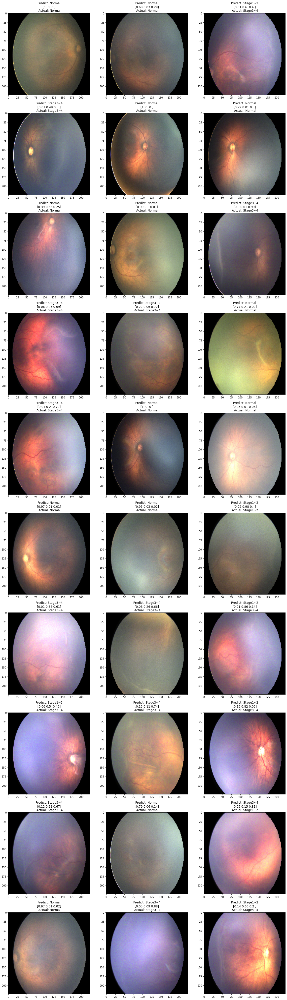

In [18]:
learner.evaluate(N = 30) # batch_size 10

# Binary Classification Test

1/1 [==============================] - 0s 31ms/step


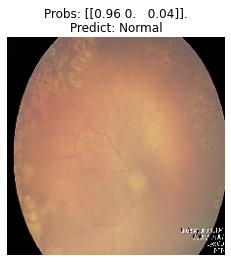

1/1 [==============================] - 0s 31ms/step


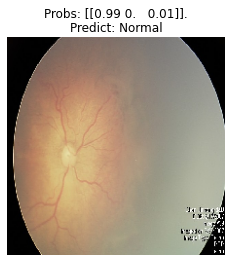

1/1 [==============================] - 0s 32ms/step


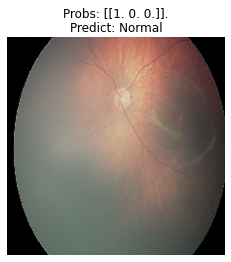

1/1 [==============================] - 0s 31ms/step


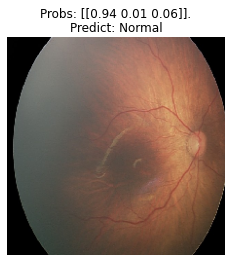

1/1 [==============================] - 0s 16ms/step


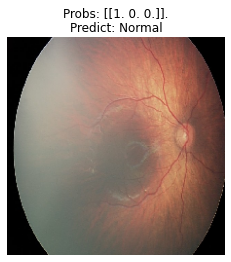

1/1 [==============================] - 0s 47ms/step


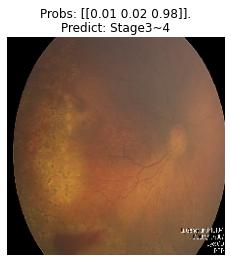

1/1 [==============================] - 0s 16ms/step


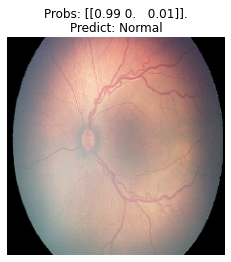

1/1 [==============================] - 0s 32ms/step


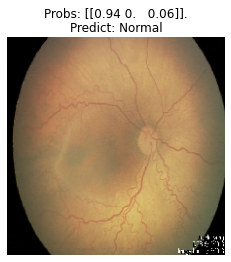

1/1 [==============================] - 0s 40ms/step


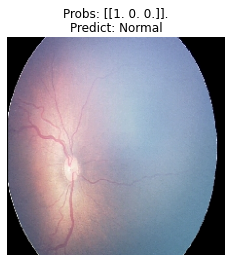

1/1 [==============================] - 0s 31ms/step


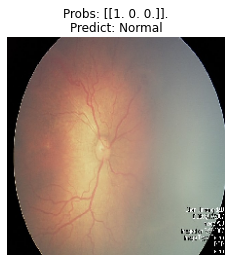

1/1 [==============================] - 0s 16ms/step


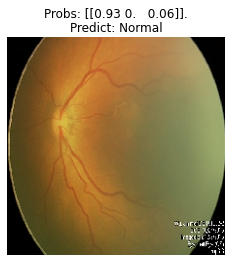

1/1 [==============================] - 0s 31ms/step


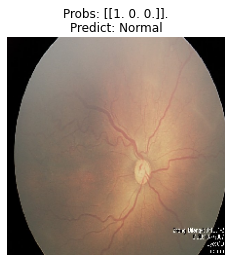

1/1 [==============================] - 0s 31ms/step


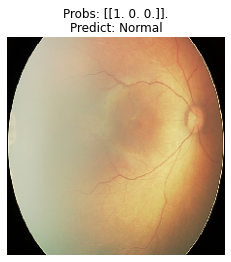

1/1 [==============================] - 0s 31ms/step


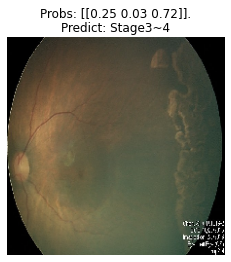

1/1 [==============================] - 0s 31ms/step


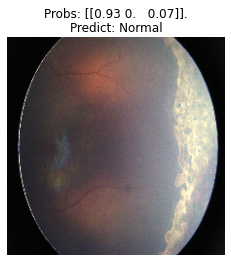

1/1 [==============================] - 0s 31ms/step


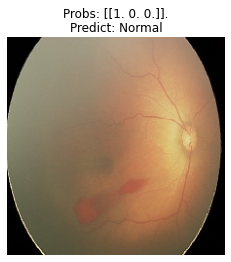

1/1 [==============================] - 0s 16ms/step


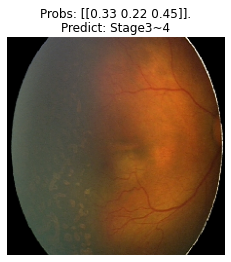

1/1 [==============================] - 0s 31ms/step


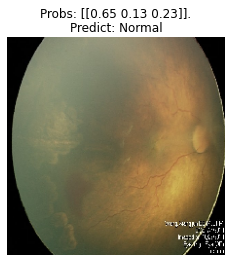

1/1 [==============================] - 0s 31ms/step


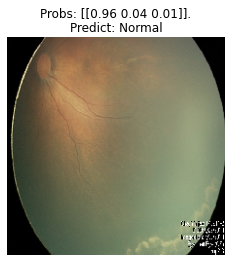

1/1 [==============================] - 0s 25ms/step


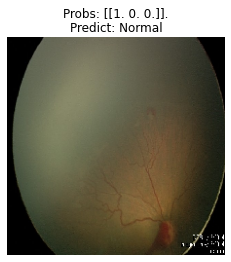

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 25ms/step
Averaged prob on disease set = 0.6666667


In [22]:
import os
import numpy as np

DIR = 'F:/备份/keras/data/fundus/C5/Disease/'  # dont't use ../data/fundus/C2T/Y/, which is included in the training set. Now is deleted

ps = []
for idx, img in enumerate(os.listdir(DIR)):
    img_path = DIR + '/'+ img        

    p = learner.predict_file(img_path, display = idx < 20, use_mask = True) # 只显示前N个数据
    ps.append(1 - p[0])
    
print('Averaged prob on disease set =', np.mean(ps))

1/1 [==============================] - 0s 31ms/step


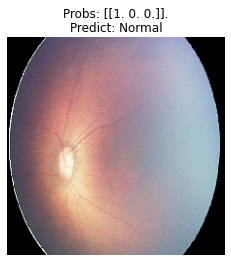

1/1 [==============================] - 0s 32ms/step


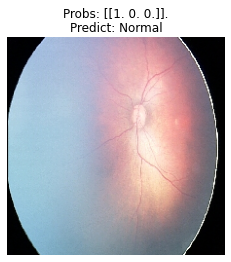

1/1 [==============================] - 0s 32ms/step


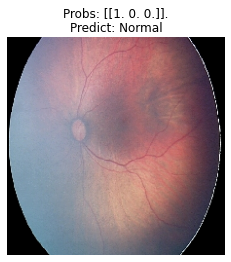

1/1 [==============================] - 0s 31ms/step


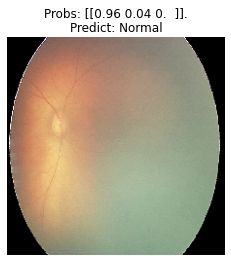

1/1 [==============================] - 0s 31ms/step


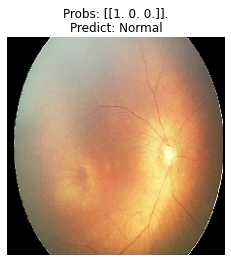

1/1 [==============================] - 0s 31ms/step


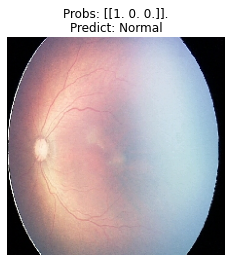

1/1 [==============================] - 0s 16ms/step


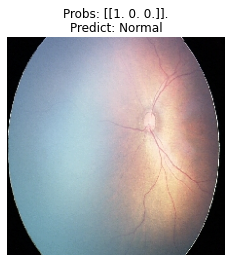

1/1 [==============================] - 0s 32ms/step


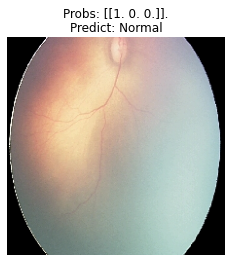

1/1 [==============================] - 0s 31ms/step


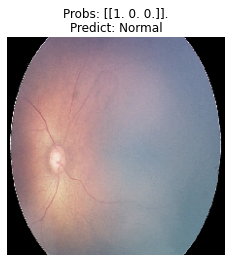

1/1 [==============================] - 0s 31ms/step


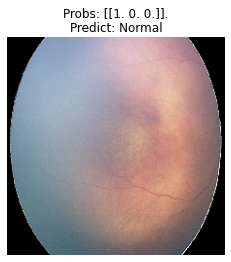

1/1 [==============================] - 0s 16ms/step


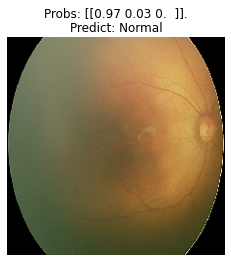

1/1 [==============================] - 0s 33ms/step


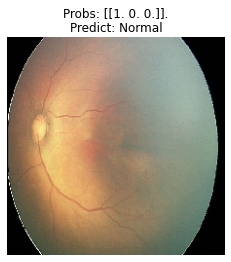

1/1 [==============================] - 0s 31ms/step


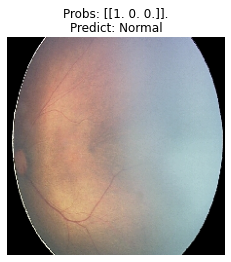

1/1 [==============================] - 0s 31ms/step


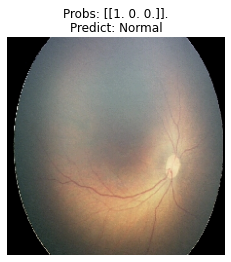

1/1 [==============================] - 0s 32ms/step


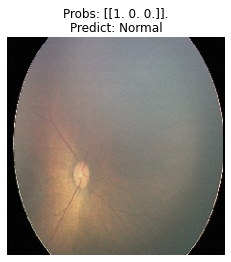

1/1 [==============================] - 0s 32ms/step


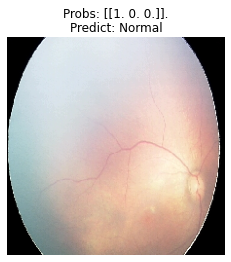

1/1 [==============================] - 0s 31ms/step


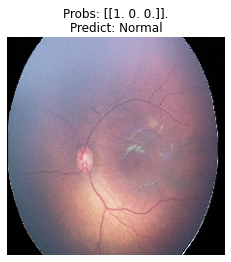

1/1 [==============================] - 0s 16ms/step


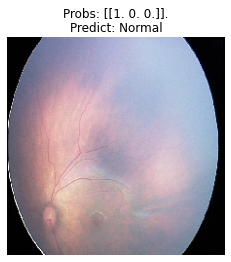

1/1 [==============================] - 0s 31ms/step


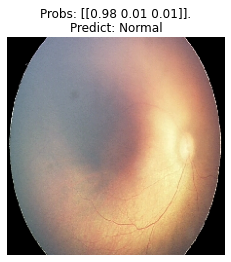

1/1 [==============================] - 0s 32ms/step


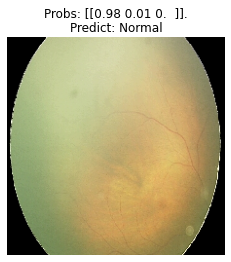

1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 32ms/step
Averaged prob on normal set = 0.33333334


In [23]:
DIR = 'F:/备份/keras/data/fundus/C5/NotDisease/' # dont't use ../data/fundus/C2T/N/, which is included in the training set. Now is deleted

ps = []
for idx, img in enumerate(os.listdir(DIR)):
    img_path = DIR + '/'+ img        

    # p = predict(custom_vgg_model, img_path, names, display = idx < 10) # 只显示前10个数据
    p = learner.predict_file(img_path, display = idx < 20, use_mask = True) # 只显示前N个数据
    ps.append(p[0]) # 0 - Normal
    
print('Averaged prob on normal set =', np.mean(ps))

# Convert to tflite

In [25]:
from tlearner.efficientnet import convert_keras_to_tflite

convert_keras_to_tflite("fundus_C3_customEfficientNetB0_model_best2.hdf5",
                        "fundus_C3_customEfficientNetB0_model_best2.tflite",
                        v1=True)

INFO:tensorflow:Assets written to: C:\Users\eleve\AppData\Local\Temp\tmpbm01f9a7\assets


INFO:tensorflow:Assets written to: C:\Users\eleve\AppData\Local\Temp\tmpbm01f9a7\assets


INFO:tensorflow:Restoring parameters from C:\Users\eleve\AppData\Local\Temp\tmpbm01f9a7\variables\variables


INFO:tensorflow:Restoring parameters from C:\Users\eleve\AppData\Local\Temp\tmpbm01f9a7\variables\variables


INFO:tensorflow:The given SavedModel MetaGraphDef contains SignatureDefs with the following keys: {'__saved_model_init_op', 'serving_default'}


INFO:tensorflow:The given SavedModel MetaGraphDef contains SignatureDefs with the following keys: {'__saved_model_init_op', 'serving_default'}


INFO:tensorflow:input tensors info: 


INFO:tensorflow:input tensors info: 


INFO:tensorflow:Tensor's key in saved_model's tensor_map: input_1


INFO:tensorflow:Tensor's key in saved_model's tensor_map: input_1


INFO:tensorflow: tensor name: serving_default_input_1:0, shape: (-1, 224, 224, 3), type: DT_FLOAT


INFO:tensorflow: tensor name: serving_default_input_1:0, shape: (-1, 224, 224, 3), type: DT_FLOAT


INFO:tensorflow:output tensors info: 


INFO:tensorflow:output tensors info: 


INFO:tensorflow:Tensor's key in saved_model's tensor_map: output


INFO:tensorflow:Tensor's key in saved_model's tensor_map: output


INFO:tensorflow: tensor name: StatefulPartitionedCall:0, shape: (-1, 3), type: DT_FLOAT


INFO:tensorflow: tensor name: StatefulPartitionedCall:0, shape: (-1, 3), type: DT_FLOAT


INFO:tensorflow:Restoring parameters from C:\Users\eleve\AppData\Local\Temp\tmpbm01f9a7\variables\variables


INFO:tensorflow:Restoring parameters from C:\Users\eleve\AppData\Local\Temp\tmpbm01f9a7\variables\variables


tflite model saved to: fundus_C3_customEfficientNetB0_model_best2.tflite
